# Import

In [4]:
from mftools.fileio import MerfishAnalysis
from mftools.cellgene import create_scanpy_object
import scanpy as sc
import pandas as pd
import numpy as np

EXPERIMENT_NAME = "Ren9"
CELLPOSE_DIR = '/mnt/merfish16/MERSCOPE/output/202402291550_20240229M144BICANRen9_VMSC10102//cellpose'
POSITIONS = '/mnt/merfish16/MERSCOPE/data/202402291550_20240229M144BICANRen9_VMSC10102/settings/positions.csv'
IMAGE_PATH = '/mnt/merfish16/MERSCOPE/data/202402291550_20240229M144BICANRen9_VMSC10102/'

CHANNEL = "DAPI" 
TEST_FOV = 500

In [5]:
output = MerfishAnalysis(CELLPOSE_DIR)

In [6]:
adata = create_scanpy_object(output)
 # adata = sc.read_h5ad("/home/eboone/CellSegmentation/CP_04_modeltest.h5ad")

/home/eboone/miniforge3/envs/JacBase/lib/python3.10/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/eboone/miniforge3/envs/JacBase/lib/python3.10/site-packages/anndata/_core/aligned_df.py:67: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/eboone/miniforge3/envs/JacBase/lib/python3.10/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
# Fix FOV coordinates:
positions = pd.read_csv(POSITIONS, header=None)

In [8]:
adata.obs

,fov_y,fov_x,fov,global_x,global_y,volume,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,blank_counts,misid_rate,counts_per_volume
40118,1129.655586,1225.310692,4,-4068.374828,321.349721,6257.0,8,2.197225,8,2.197225,0,0.0,0.001279
90162,1015.511797,1944.920937,9,-3991.072946,1309.088181,16784.0,1,0.693147,1,0.693147,0,0.0,0.000060
90219,1275.206664,1395.323572,9,-4050.111726,1336.985091,17826.0,1,0.693147,1,0.693147,0,0.0,0.000056
140116,1486.332398,1077.152880,14,-3884.290218,959.664613,22449.0,2,1.098612,2,1.098612,0,0.0,0.000089
160202,915.858375,1756.817319,16,-3811.279390,498.383224,5797.0,1,0.693147,1,0.693147,0,0.0,0.000173
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9990016,1535.430114,369.735072,999,1839.717635,-1435.061218,12041.0,0,0.000000,0,0.000000,0,NaN,0.000000
9990017,1753.088929,634.520871,999,1868.161422,-1411.679900,6612.0,0,0.000000,0,0.000000,0,NaN,0.000000
9990018,1785.459167,1922.584157,999,2006.527595,-1408.202629,10231.0,0,0.000000,0,0.000000,0,NaN,0.000000
9990024,2001.428691,26.960838,999,1802.896184,-1385.002777,4109.0,0,0.000000,0,0.000000,0,NaN,0.000000


In [9]:
# Fix FOV coordinates:

gx = 220 * ((2048 - adata.obs["fov_x"]) / 2048) + positions.iloc[adata.obs["fov"]][1].values
gy = 220 * ((2048 - adata.obs["fov_y"]) / 2048) + positions.iloc[adata.obs["fov"]][0].values

adata.obs["global_x"] = gx
adata.obs["global_y"] = gy
adata.obsm["X_spatial"] = adata.obs[["global_x", "global_y"]].to_numpy()

In [10]:
# TODO: this is useful, put this in MFtools

def rotate_spatial_coordinates(adata):
    X_spatial = adata.obsm['X_spatial']
    rotation_matrix = np.array([[0, -1],
                                    [1, 0]])
    X_spatial_rotated = X_spatial.dot(rotation_matrix)
    adata.obsm['X_spatial'] = X_spatial_rotated

rotate_spatial_coordinates(adata)

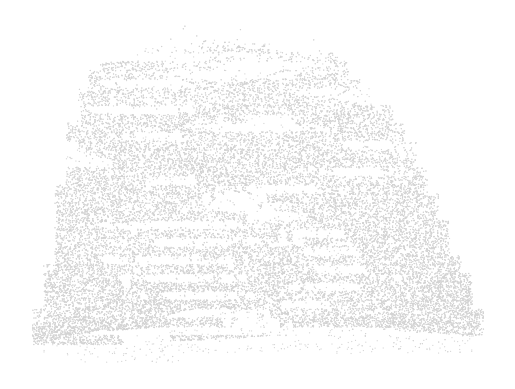

In [11]:
sc.pl.embedding(adata, basis="spatial", frameon=False)


In [12]:
# adata.write('/mnt/merfish18/BICAN/objects/BICAN_R1toR17_pre.h5ad')

# Pre-processing and QC

In [13]:
import scanpy as sc
# raw_adata = sc.read_h5ad('/mnt/merfish18/BICAN/objects/BICAN_R1toR17_pre.h5ad')
adata = sc.read_h5ad('/mnt/merfish18/BICAN/objects/BICAN_R1toR17_pre.h5ad')

PermissionError: [Errno 13] Unable to open file (unable to open file: name = '/mnt/merfish18/BICAN/objects/BICAN_R1toR17_pre.h5ad', errno = 13, error message = 'Permission denied', flags = 0, o_flags = 0)

In [14]:
adata.obs

,fov_y,fov_x,fov,global_x,global_y,volume,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,blank_counts,misid_rate,counts_per_volume
40118,1129.655586,1225.310692,4,-6511.625172,-3701.349721,6257.0,8,2.197225,8,2.197225,0,0.0,0.001279
90162,1015.511797,1944.920937,9,-6588.927054,-4689.088181,16784.0,1,0.693147,1,0.693147,0,0.0,0.000060
90219,1275.206664,1395.323572,9,-6529.888274,-4716.985091,17826.0,1,0.693147,1,0.693147,0,0.0,0.000056
140116,1486.332398,1077.152880,14,-6295.709782,-4939.664613,22449.0,2,1.098612,2,1.098612,0,0.0,0.000089
160202,915.858375,1756.817319,16,-6368.720610,-4478.383224,5797.0,1,0.693147,1,0.693147,0,0.0,0.000173
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9990016,1535.430114,369.735072,999,180.282365,-7344.938782,12041.0,0,0.000000,0,0.000000,0,NaN,0.000000
9990017,1753.088929,634.520871,999,151.838578,-7368.320100,6612.0,0,0.000000,0,0.000000,0,NaN,0.000000
9990018,1785.459167,1922.584157,999,13.472405,-7371.797371,10231.0,0,0.000000,0,0.000000,0,NaN,0.000000
9990024,2001.428691,26.960838,999,217.103816,-7394.997223,4109.0,0,0.000000,0,0.000000,0,NaN,0.000000


In [16]:
from mftools.fileio import ImageDataset
from mftools.segmentation import CellSegmentation
import matplotlib.pyplot as plt
import numpy as np

imageset = ImageDataset(IMAGE_PATH)
seg = CellSegmentation(imagedata=imageset, channel=CHANNEL, zslice=3)

dapi = imageset.load_image(channel=CHANNEL, fov=TEST_FOV, max_projection=True)
mask = seg[TEST_FOV]
plt.figure(dpi=150)
plt.imshow(dapi, cmap="gray")
plt.contour(mask, [x+0.5 for x in np.unique(mask)], colors="tab:blue")
plt.axis("off")

ValueError: too many values to unpack (expected 3)

In [25]:
nCells = len(adata.obs)
nTSCP = adata.obs['total_counts'].sum()
medTSCP_Cell = adata.obs['total_counts'].median()
medGenes_Cell = adata.obs['n_genes_by_counts'].median()
print(f"nCells = {nCells}")
print(f"nTSCP = {nTSCP}")
print(f"medTSCP_Cell = {medTSCP_Cell}")
print(f"medGenes_Cell = {medGenes_Cell}")

nCells = 18774
nTSCP = 2800645
medTSCP_Cell = 85.0
medGenes_Cell = 47.0


In [20]:
from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc


In [18]:
# calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=(50, 100, 200, 300), inplace=True)

/home/eboone/miniforge3/envs/JacBase/lib/python3.10/site-packages/scanpy/preprocessing/_qc.py:431: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]


<Axes: title={'center': 'Ren10 - Volume of segmented cells'}, xlabel='volume', ylabel='Count'>

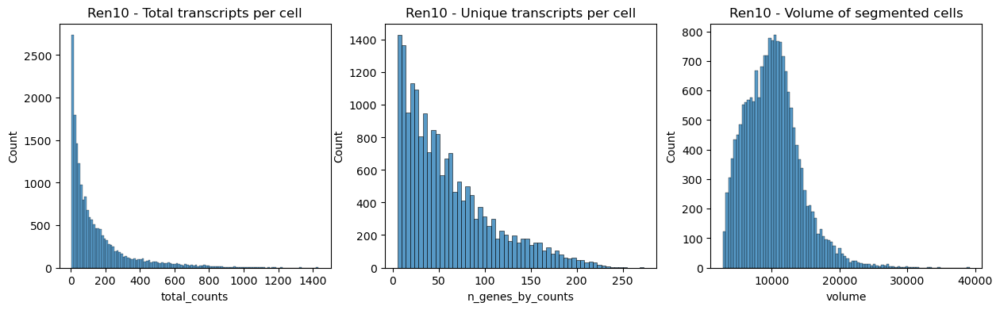

In [24]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

axs[0].set_title(f"{EXPERIMENT_NAME} - Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title(f"{EXPERIMENT_NAME} - Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)

axs[2].set_title(f"{EXPERIMENT_NAME} - Volume of segmented cells")
sns.histplot(
    adata.obs["volume"],
    kde=False,
    ax=axs[2],
)

In [23]:
import scanpy as sc
# adata = sc.read_h5ad('BICAN_R1toR13_pre.h5ad')
# sc.settings.verbosity = 3
sc.pp.filter_cells(adata, min_genes=5)
sc.pp.filter_genes(adata, min_cells=3)

In [15]:
adataR001 = adata[adata.obs['batch'] == 'REN001']
adataR002 = adata[adata.obs['batch'] == 'REN002']
adataR003 = adata[adata.obs['batch'] == 'REN003']
adataR004 = adata[adata.obs['batch'] == 'REN004']
adataR005 = adata[adata.obs['batch'] == 'REN005']
adataR006 = adata[adata.obs['batch'] == 'REN006']
adataR007 = adata[adata.obs['batch'] == 'REN007']
adataR008 = adata[adata.obs['batch'] == 'REN008']
adataR009 = adata[adata.obs['batch'] == 'REN009']
adataR010 = adata[adata.obs['batch'] == 'REN010']
adataR011 = adata[adata.obs['batch'] == 'REN011']
adataR012 = adata[adata.obs['batch'] == 'REN012']
adataR013 = adata[adata.obs['batch'] == 'REN013']

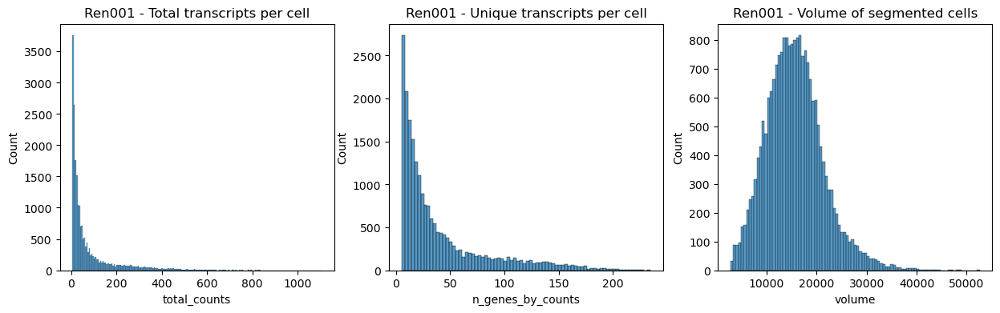

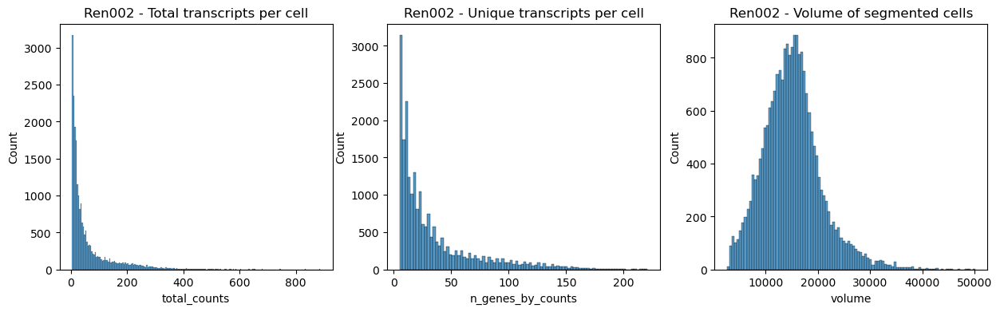

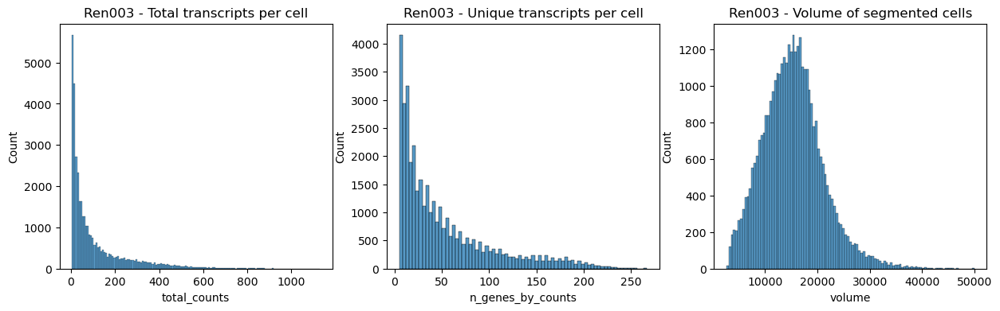

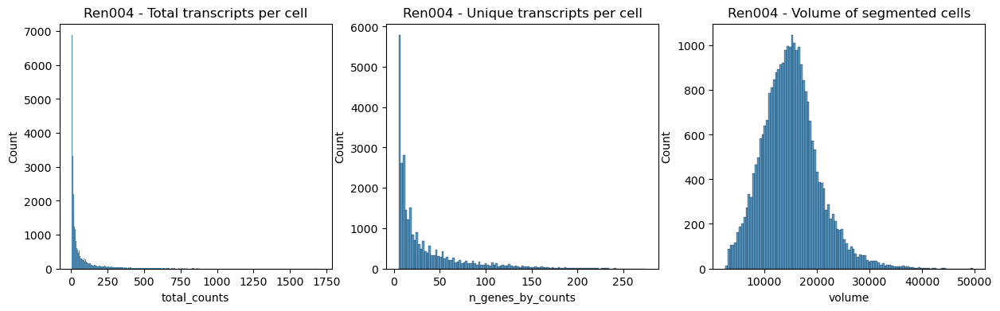

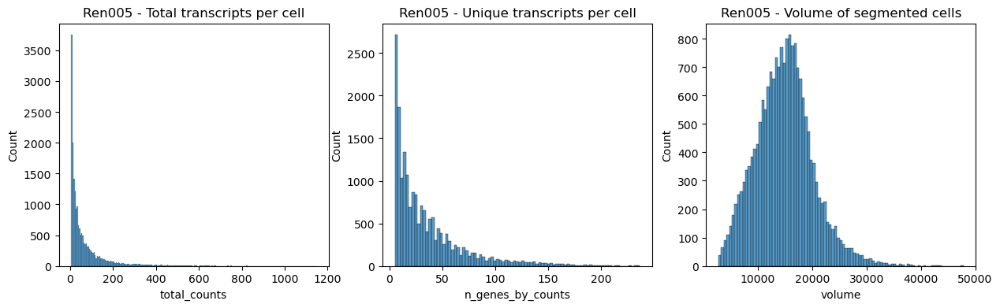

...

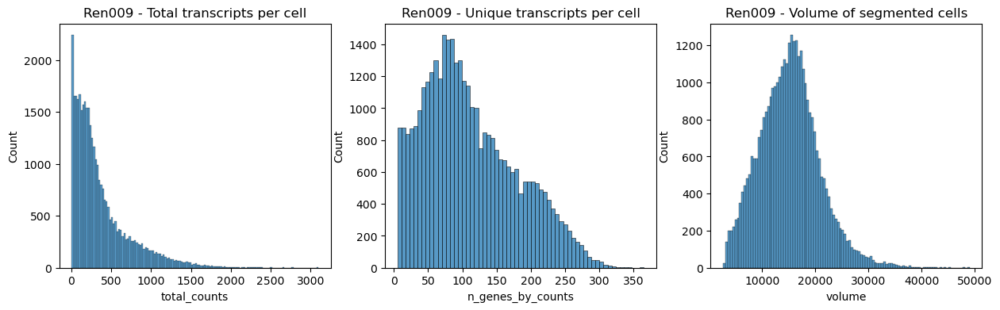

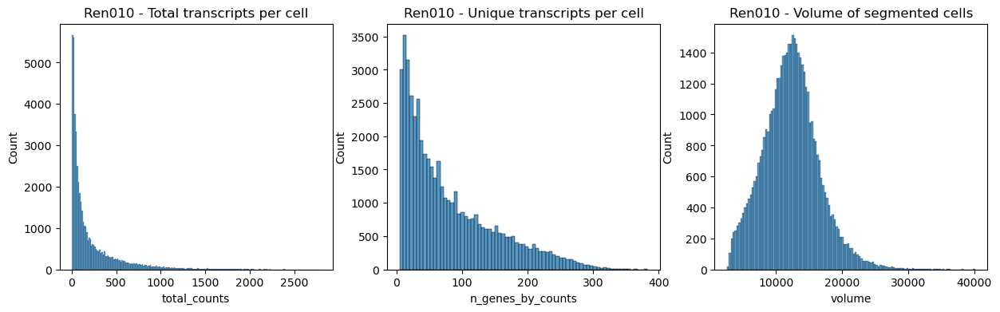

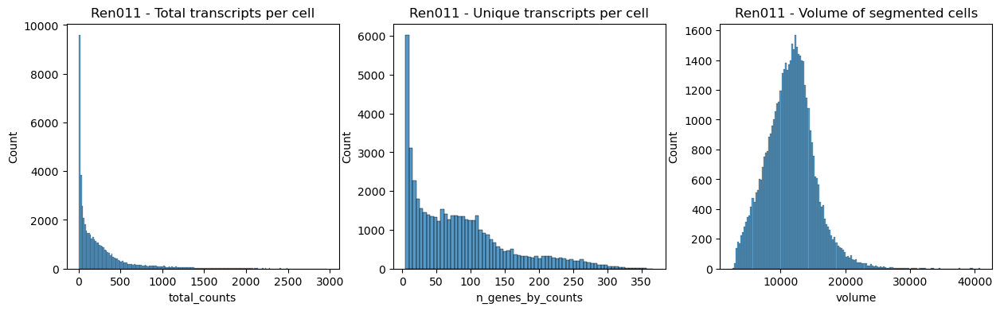

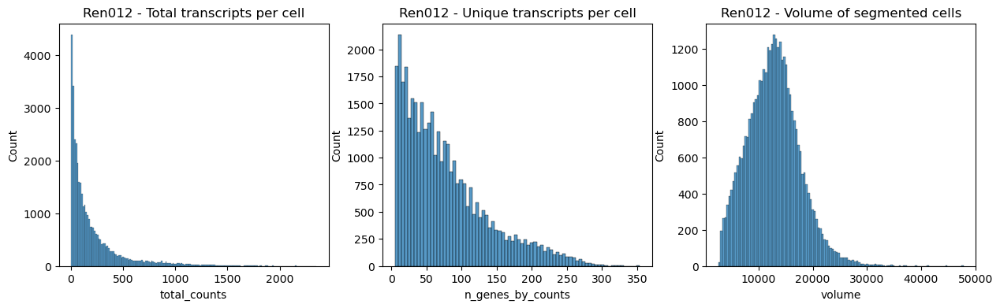

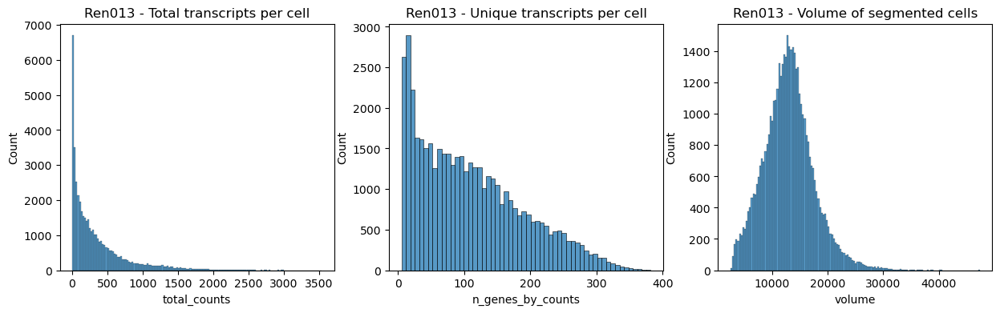

In [16]:
import matplotlib 
samples = [adataR001, adataR002, adataR003, adataR004, adataR005, adataR006, adataR007, adataR008, adataR009, adataR010, adataR011, adataR012, adataR013]
names = ['Ren001', 'Ren002', 'Ren003', 'Ren004', 'Ren005', 'Ren006', 'Ren007', 'Ren008', 'Ren009', 'Ren010', 'Ren011', 'Ren012', 'Ren013']
for n, adata in enumerate(samples):
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))

    axs[0].set_title(f"{names[n]} - Total transcripts per cell")
    sns.histplot(
        adata.obs["total_counts"],
        kde=False,
        ax=axs[0],
    )

    axs[1].set_title(f"{names[n]} - Unique transcripts per cell")
    sns.histplot(
        adata.obs["n_genes_by_counts"],
        kde=False,
        ax=axs[1],
    )

    axs[2].set_title(f"{names[n]} - Volume of segmented cells")
    sns.histplot(
        adata.obs["volume"],
        kde=False,
        ax=axs[2],
    )

# QC Metrics

In [18]:
samples = [adataR001, adataR002, adataR003, adataR004, adataR005, adataR006, adataR007, adataR008, adataR009, adataR010, adataR011, adataR012, adataR013]
names = ['REN001', 'REN002', 'REN003', 'REN004', 'REN005', 'REN006', 'REN007', 'REN008', 'REN009', 'REN010', 'REN011', 'REN012', 'REN013']

for n, sample in enumerate(samples):
    nCells = len(sample.obs)
    nTSCP = sample.obs['total_counts'].sum()
    medTSCP_Cell = sample.obs['total_counts'].median()
    medGenes_Cell = sample.obs['n_genes_by_counts'].median()
    # print(f"{names[n]} - nCells = {nCells}")
    # print(f"{names[n]} - nTSCP = {nTSCP}")
    # print(f"{names[n]} - medTSCP_Cell = {medTSCP_Cell}")
    print(f"{names[n]} - medGenes_Cell = {medGenes_Cell}")

REN001 - medGenes_Cell = 23.0
REN002 - medGenes_Cell = 20.0
REN003 - medGenes_Cell = 34.0
REN004 - medGenes_Cell = 17.0
REN005 - medGenes_Cell = 24.0
REN006 - medGenes_Cell = 21.0
REN007 - medGenes_Cell = 13.0
REN008 - medGenes_Cell = 85.0
REN009 - medGenes_Cell = 99.0
REN010 - medGenes_Cell = 58.0
REN011 - medGenes_Cell = 68.0
REN012 - medGenes_Cell = 62.0
REN013 - medGenes_Cell = 95.0


In [ ]:
import scanpy as sc
# adata = sc.read_h5ad('/mnt/merfish18/BICAN/objects/BICAN_R1toR17_pre.h5ad')
# sc.settings.verbosity = 3
# sc.pp.filter_cells(adata, min_genes=5)
# sc.pp.filter_genes(adata, min_cells=3)

adataR001 = adata[adata.obs['batch'] == 'REN001']
adataR002 = adata[adata.obs['batch'] == 'REN002']
adataR003 = adata[adata.obs['batch'] == 'REN003']
adataR004 = adata[adata.obs['batch'] == 'REN004']
adataR005 = adata[adata.obs['batch'] == 'REN005']
adataR006 = adata[adata.obs['batch'] == 'REN006']
adataR007 = adata[adata.obs['batch'] == 'REN007']
adataR008 = adata[adata.obs['batch'] == 'REN008']
adataR009 = adata[adata.obs['batch'] == 'REN009']
adataR010 = adata[adata.obs['batch'] == 'REN010']
adataR011 = adata[adata.obs['batch'] == 'REN011']
adataR012 = adata[adata.obs['batch'] == 'REN012']
adataR013 = adata[adata.obs['batch'] == 'REN013']
adataR014 = adata[adata.obs['batch'] == 'REN014']
adataR015 = adata[adata.obs['batch'] == 'REN015']
adataR016 = adata[adata.obs['batch'] == 'REN016']
adataR017 = adata[adata.obs['batch'] == 'REN017']


samples = [adataR001, adataR002, adataR003, adataR004, adataR005, adataR006, adataR007, adataR008, adataR009, adataR010, adataR011, adataR012, adataR013, adataR014, adataR015, adataR016, adataR017]
names = ['REN001', 'REN002', 'REN003', 'REN004', 'REN005', 'REN006', 'REN007', 'REN008', 'REN009', 'REN010', 'REN011', 'REN012', 'REN013', 'REN014', 'REN015', 'REN016', 'REN017']

for n, sample in enumerate(samples):
    nCells = len(sample.obs)
    nTSCP = sample.obs['total_counts'].sum()
    medTSCP_Cell = sample.obs['total_counts'].median()
    medGenes_Cell = sample.obs['n_genes_by_counts'].median()
    # print(f"{names[n]} - nCells = {nCells}")
    # print(f"{names[n]} - nTSCP = {nTSCP}")
    # print(f"{names[n]} - medTSCP_Cell = {medTSCP_Cell}")
    print(f"{names[n]} - medGenes_Cell = {medGenes_Cell}")

# Control Genes

         Sample      Gene  Percentage
0    SampleR001      UBR2   14.824356
1    SampleR001  PAFAH1B1   21.793911
2    SampleR001      RBM5   22.065574
3    SampleR001     PSMD1    8.285714
4    SampleR001      RBM6   21.892272
..          ...       ...         ...
335  SampleR017     YLPM1    0.220264
336  SampleR017      CUL5    2.086460
337  SampleR017  SMARCAD1    1.009343
338  SampleR017      OPA1    1.522486
339  SampleR017    DCAF10    0.958513

[340 rows x 3 columns]


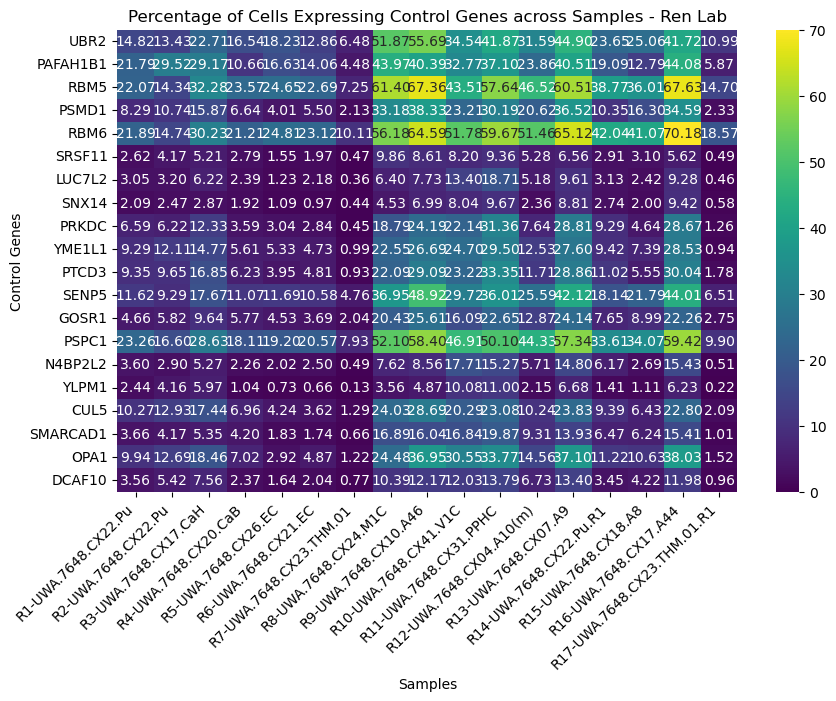

In [16]:
import pandas as pd # PERCENTAGE

# Create a dictionary to store the results
results = {'Sample': [], 'Gene': [], 'Percentage': []}
samples = [adataR001, adataR002, adataR003, adataR004, adataR005, adataR006, adataR007, adataR008, adataR009, adataR010, adataR011, adataR012, adataR013, adataR014, adataR015, adataR016, adataR017]
sample_names = ['R001', 'R002', 'R003', 'R004', 'R005', 'R006', 'R007', 'R008', 'R009', 'R010', 'R011', 'R012', 'R013', 'R014', 'R015', 'R016', 'R017']
genes = ['UBR2', 'PAFAH1B1','RBM5', 'PSMD1', 'RBM6', 'SRSF11', 'LUC7L2', 'SNX14', 'PRKDC', 'YME1L1', 'PTCD3', 'SENP5', 'GOSR1', 'PSPC1', 'N4BP2L2', 'YLPM1', 'CUL5', 'SMARCAD1', 'OPA1', 'DCAF10']
# Iterate over each sample
for n, sample in enumerate(samples):  # Assuming samples are named Sample1, Sample2, ..., Sample9
    # Load or access each AnnData object
    adata = sample  # Replace this with your method of loading/accessing AnnData
    
    # Iterate over 20 different genes
    for gene_name in genes:  # Replace with your gene names
        # Check if the gene is present in the AnnData object
        if gene_name in adata.var_names:
            # Get the index of the gene in the var_names array
            gene_index = list(adata.var_names).index(gene_name)
            
            # Count the number of cells expressing the gene
            cells_with_gene = sum(adata.X[:, gene_index] > 0)
            
            # Calculate the percentage
            percentage_cells_with_gene = (cells_with_gene / adata.n_obs) * 100
            
            # Append the results to the dictionary
            results['Sample'].append(f'Sample{sample_names[n]}')
            results['Gene'].append(gene_name)
            results['Percentage'].append(percentage_cells_with_gene)
        else:
            # If gene not found, append NaN
            results['Sample'].append(f'Sample{sample_names[n]}')
            results['Gene'].append(gene_name)
            results['Percentage'].append(float('nan'))

# Convert the dictionary to a DataFrame
df = pd.DataFrame(results)

# Display the DataFrame
print(df)

pivot_df = df.pivot(index='Gene', columns='Sample', values='Percentage')
pivot_df = pivot_df.reindex(genes)


plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, cmap='viridis', annot=True, fmt=".2f", vmin=0, vmax=70, xticklabels=['R1-UWA.7648.CX22.Pu', 'R2-UWA.7648.CX22.Pu', 'R3-UWA.7648.CX17.CaH', 'R4-UWA.7648.CX20.CaB', 'R5-UWA.7648.CX26.EC', 'R6-UWA.7648.CX21.EC', 'R7-UWA.7648.CX23.THM.01', 'R8-UWA.7648.CX24.M1C', 'R9-UWA.7648.CX10.A46', 'R10-UWA.7648.CX41.V1C', 'R11-UWA.7648.CX31.PPHC', 'R12-UWA.7648.CX04.A10(m)','R13-UWA.7648.CX07.A9', 'R14-UWA.7648.CX22.Pu.R1', 'R15-UWA.7648.CX18.A8', 'R16-UWA.7648.CX17.A44', 'R17-UWA.7648.CX23.THM.01.R1'])
plt.xlabel('Samples')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Control Genes')
plt.title('Percentage of Cells Expressing Control Genes across Samples - Ren Lab')
plt.show()


In [35]:
df.to_csv('BICAN_internalgenes.csv')

In [20]:
adataR001.obs_vector('PAFAH1B1').mean()

array(0.31311475)

                          REN1                  REN2                  REN3  \
UBR2       0.19882903981264638   0.17442279942279942   0.33012245328829304   
PAFAH1B1   0.31311475409836065    0.4707792207792208    0.5052517681832577   
RBM5        0.4188758782201405   0.20815295815295815    0.7017312361448327   
PSMD1      0.09747072599531616   0.13410894660894662    0.2133959674865407   
RBM6       0.37925058548009366    0.2077922077922078    0.5773250290298744   
SRSF11    0.028665105386416864  0.045815295815295816  0.058613955452338225   
LUC7L2     0.03203747072599532   0.03341450216450217   0.06795629684366093   
SNX14     0.022388758782201406  0.026424963924963924  0.030111896970336748   
PRKDC       0.0751288056206089   0.07151875901875902   0.15314578275097646   
YME1L1     0.10918032786885246   0.15115440115440115   0.18748020690383194   
PTCD3       0.1117096018735363   0.11476370851370851    0.2279900770611211   
SENP5      0.15133489461358313   0.11264430014430014   0.2437189

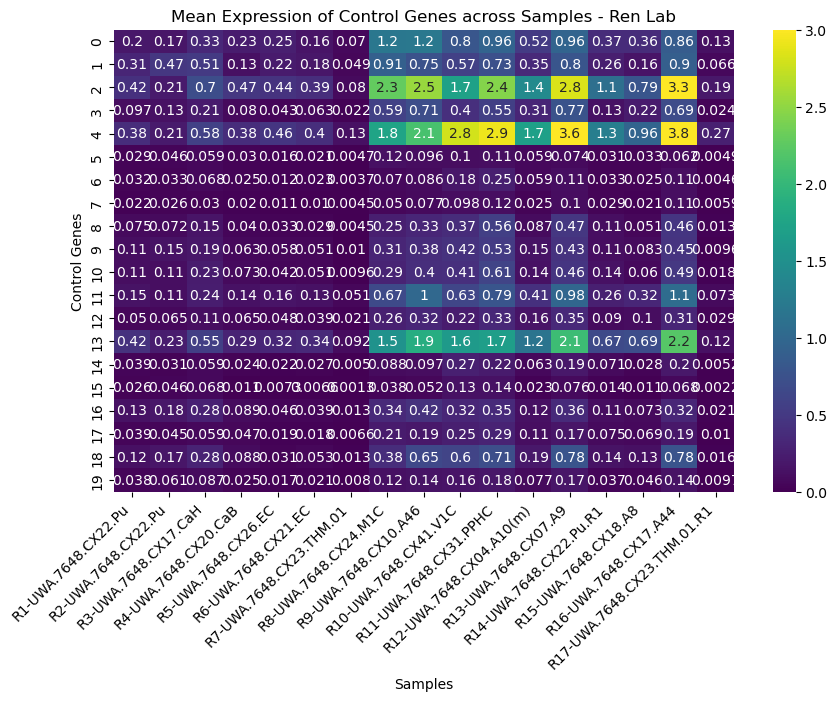

In [17]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

adata_objects = [adataR001, adataR002, adataR003, adataR004, adataR005, adataR006, adataR007, adataR008, adataR009, adataR010, adataR011, adataR012, adataR013, adataR014, adataR015, adataR016, adataR017]
sample_names = ['R001', 'R002', 'R003', 'R004', 'R005', 'R006', 'R007', 'R008', 'R009', 'R010', 'R011', 'R012', 'R013', 'R014', 'R015', 'R016', 'R017']
control_genes = ['UBR2', 'PAFAH1B1','RBM5', 'PSMD1', 'RBM6', 'SRSF11', 'LUC7L2', 'SNX14', 'PRKDC', 'YME1L1', 'PTCD3', 'SENP5', 'GOSR1', 'PSPC1', 'N4BP2L2', 'YLPM1', 'CUL5', 'SMARCAD1', 'OPA1', 'DCAF10']

def calculate_mean_expression(control_genes, adata_objects):
    mean_expression_values = []
    for gene in control_genes:
        expression_values = []
        for adata in adata_objects:
            expression_values.append(adata.obs_vector(gene).mean())
        mean_expression_values.append(expression_values)
    return mean_expression_values

# Function to display mean expression values as a table
def display_table(control_genes, mean_expression_values):
    df = pd.DataFrame(mean_expression_values, index=control_genes)
    df.columns = ['REN{}'.format(i+1) for i in range(len(mean_expression_values[0]))]
    print(df)

# Function to display mean expression values as a heatmap
def display_heatmap(control_genes, mean_expression_values):
    plt.figure(figsize=(10, 6))
    sns.heatmap(mean_expression_values, cmap='viridis', annot=True, vmin=0, vmax=3, xticklabels=['R1-UWA.7648.CX22.Pu', 'R2-UWA.7648.CX22.Pu', 'R3-UWA.7648.CX17.CaH', 'R4-UWA.7648.CX20.CaB', 'R5-UWA.7648.CX26.EC', 'R6-UWA.7648.CX21.EC', 'R7-UWA.7648.CX23.THM.01', 'R8-UWA.7648.CX24.M1C', 'R9-UWA.7648.CX10.A46', 'R10-UWA.7648.CX41.V1C', 'R11-UWA.7648.CX31.PPHC', 'R12-UWA.7648.CX04.A10(m)','R13-UWA.7648.CX07.A9', 'R14-UWA.7648.CX22.Pu.R1', 'R15-UWA.7648.CX18.A8', 'R16-UWA.7648.CX17.A44', 'R17-UWA.7648.CX23.THM.01.R1'])
    plt.xlabel('Samples')
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Control Genes')
    plt.title('Mean Expression of Control Genes across Samples - Ren Lab')
    plt.show()

control_genes = control_genes


# Calculate mean expression values
mean_expression_values = calculate_mean_expression(control_genes, adata_objects)

# Display mean expression values as a table
display_table(control_genes, mean_expression_values)

# Display mean expression values as a heatmap
display_heatmap(control_genes, mean_expression_values)


## Wei's results

In [80]:
control_genes = ['UBR2', 'PAFAH1B1','RBM5', 'PSMD1', 'RBM6', 'SRSF11', 'LUC7L2', 'SNX14', 'PRKDC', 'YME1L1', 'PTCD3', 'SENP5', 'GOSR1', 'PSPC1', 'N4BP2L2', 'YLPM1', 'CUL5', 'SMARCAD1', 'OPA1', 'DCAF10']


In [92]:
Ecker_20mean = pd.read_csv('/home/jeolness/Documents/References/Collab_data/ic20.mean.csv')
Ecker_20pcnt = pd.read_csv('/home/jeolness/Documents/References/Collab_data/ic20.pcnt.csv')
Ecker_20mean.set_index(Ecker_20mean.columns[0], inplace=True)
Ecker_20pcnt.set_index(Ecker_20pcnt.columns[0], inplace=True)


Ecker_20mean_reordered = Ecker_20mean.reindex(control_genes)
Ecker_20pcnt_reordered = Ecker_20pcnt.reindex(control_genes)
Ecker_20pcnt_reordered = Ecker_20pcnt_reordered.multiply(100)


Ecker_20pcnt_reordered



,Ecker: UWA.7648.CX21.EC,Ecker: UWA.7648.CX26.EC,Ecker: UWA.7648.CX17.CaH,Ecker: UWA.7648.CX20.CaB,Ecker: UWA.7648.CX23.THM.01
Unnamed: 0,,,,,
UBR2,35.488792,31.251224,40.093288,25.786208,39.920785
PAFAH1B1,31.369558,36.329221,36.759612,20.504865,36.363010
RBM5,49.401479,41.420273,52.495113,37.314906,52.867229
PSMD1,21.429410,14.254944,26.515074,13.756875,24.422249
RBM6,48.544772,42.438483,47.871866,37.787336,48.365765
SRSF11,7.974416,5.972195,11.818774,4.181357,7.329086
LUC7L2,7.510856,4.046733,13.447886,5.415315,6.705700
SNX14,5.856120,4.157692,6.739376,3.412777,6.412950
PRKDC,20.701796,18.686770,27.098124,15.822874,24.818323


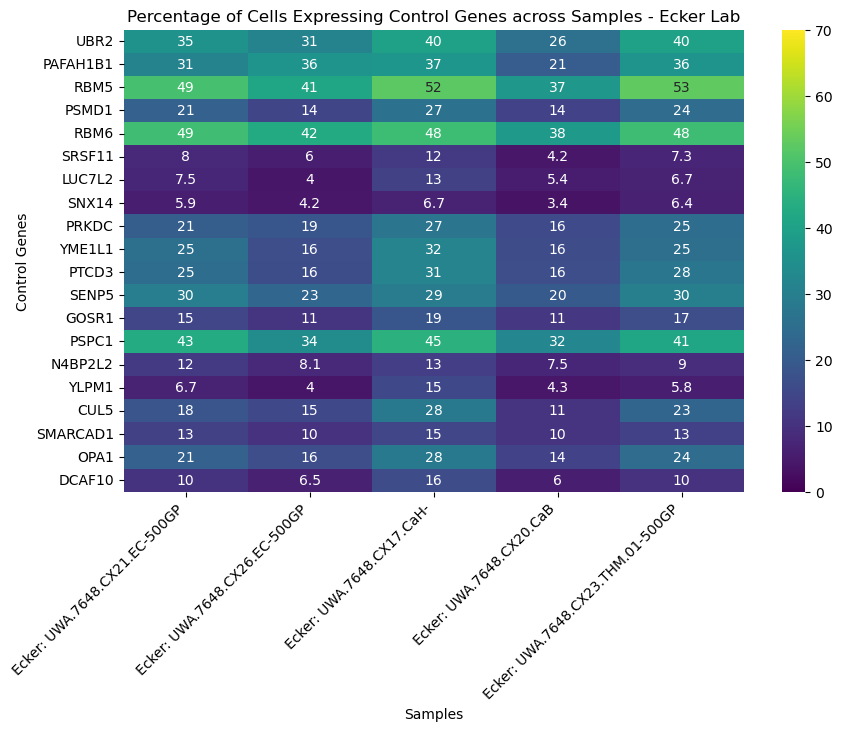

In [96]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.heatmap(Ecker_20pcnt_reordered, cmap='viridis', annot=True, vmin=0, vmax=70, xticklabels=['Ecker: UWA.7648.CX21.EC-500GP', 'Ecker: UWA.7648.CX26.EC-500GP', 'Ecker: UWA.7648.CX17.CaH-', 'Ecker: UWA.7648.CX20.CaB', 'Ecker: UWA.7648.CX23.THM.01-500GP'])
plt.xlabel('Samples')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Control Genes')
plt.title('Percentage of Cells Expressing Control Genes across Samples - Ecker Lab')
plt.show()


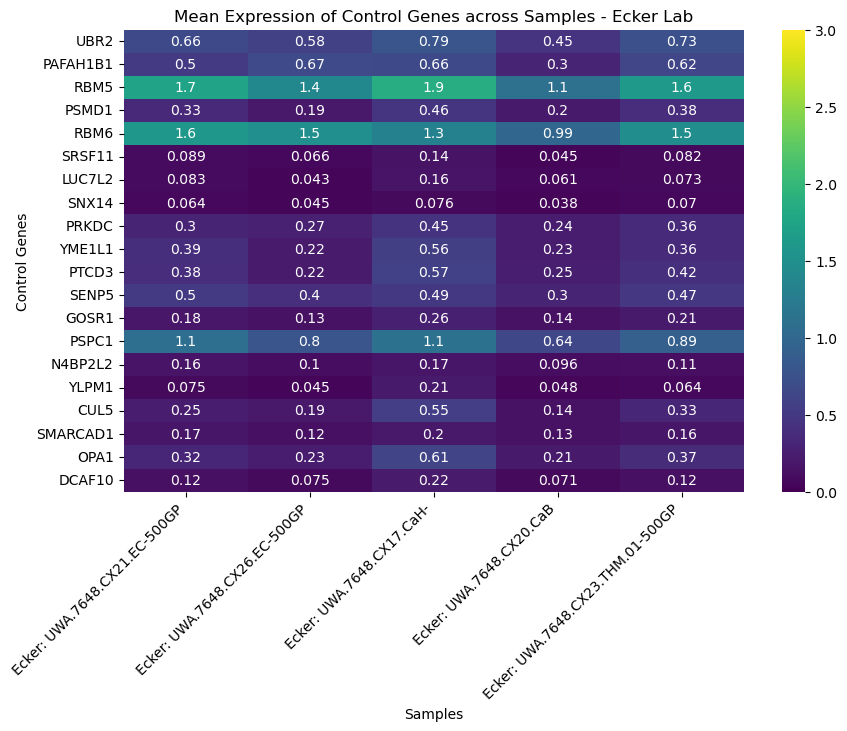

In [93]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.heatmap(Ecker_20mean_reordered, cmap='viridis', annot=True, vmin=0, vmax=3, xticklabels=['Ecker: UWA.7648.CX21.EC-500GP', 'Ecker: UWA.7648.CX26.EC-500GP', 'Ecker: UWA.7648.CX17.CaH-', 'Ecker: UWA.7648.CX20.CaB', 'Ecker: UWA.7648.CX23.THM.01-500GP'])
plt.xlabel('Samples')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Control Genes')
plt.title('Mean Expression of Control Genes across Samples - Ecker Lab')
plt.show()


# Clustering

In [18]:
import scanpy as sc
adata = sc.read_h5ad('/mnt/merfish18/BICAN/objects/BICAN_R1toR17_pre.h5ad')

/home/jeolness/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1898: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [19]:
sc.settings.verbosity = 3
sc.pp.filter_cells(adata, min_genes=5)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 842689 cells that have less than 5 genes expressed


In [20]:
adataR001 = adata[adata.obs['batch'] == 'REN001']
adataR002 = adata[adata.obs['batch'] == 'REN002']
adataR003 = adata[adata.obs['batch'] == 'REN003']
adataR004 = adata[adata.obs['batch'] == 'REN004']
adataR005 = adata[adata.obs['batch'] == 'REN005']
adataR006 = adata[adata.obs['batch'] == 'REN006']
adataR007 = adata[adata.obs['batch'] == 'REN007']
adataR008 = adata[adata.obs['batch'] == 'REN008']
adataR009 = adata[adata.obs['batch'] == 'REN009']
adataR010 = adata[adata.obs['batch'] == 'REN010']
adataR011 = adata[adata.obs['batch'] == 'REN011']
adataR012 = adata[adata.obs['batch'] == 'REN012']
adataR013 = adata[adata.obs['batch'] == 'REN013']
adataR014 = adata[adata.obs['batch'] == 'REN014']
adataR015 = adata[adata.obs['batch'] == 'REN015']
adataR016 = adata[adata.obs['batch'] == 'REN016']
adataR017 = adata[adata.obs['batch'] == 'REN017']

In [24]:
pu = adataR001.concatenate([adataR002, adataR014], batch_categories=['REN001', 'REN002', 'REN014'])
cah = adataR003
cab = adataR004
thm = adataR007.concatenate([adataR017], batch_categories=['REN007', 'REN017'])
ec = adataR005.concatenate([adataR006], batch_categories=['REN005', 'REN006'])
m1c = adataR008
a46 = adataR009
v1c = adataR010
pphc = adataR011
a10 = adataR012
a9 = adataR013
a8 = adataR015
a44 = adataR016

/home/jeolness/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
/home/jeolness/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
/home/jeolness/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [26]:
regions = [pu, cah, cab, ec, thm, m1c, a46, v1c, pphc, a10, a9, a8, a44]

for region in regions:
    # sc.pp.highly_variable_genes(region, flavor="seurat_v3", n_top_genes=4000)
    sc.pp.normalize_total(region, inplace=True)
    sc.pp.log1p(region)
    sc.pp.pca(region)
    sc.pp.neighbors(region, n_neighbors=30, metric='correlation')
    sc.tl.umap(region, min_dist=0.001, spread=3.0)
    sc.tl.leiden(region)

normalizing counts per cell


    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:02:50)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:38)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:21)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels 

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:15)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:30)


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)
running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:55)
normalizing counts per cell
    finished (0:00:00)


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:37)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:30)
normalizing counts per cell
    finished (0:00:00)


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)
running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:57)
normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:12)


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_normalization.py:169: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:13)


/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


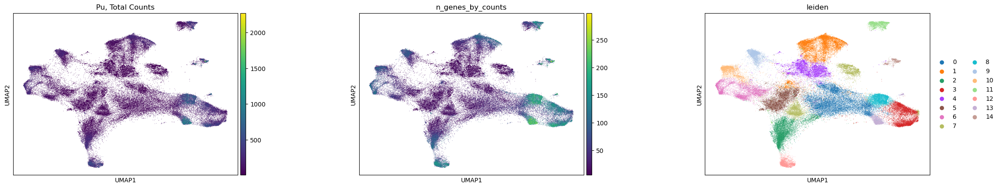

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


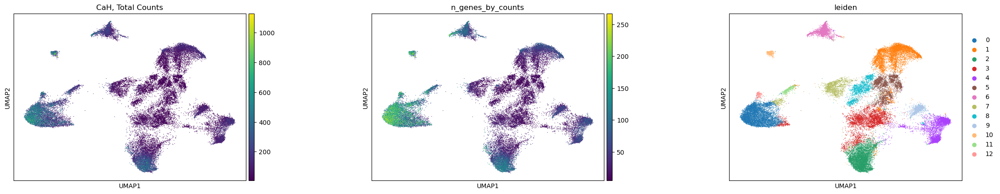

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


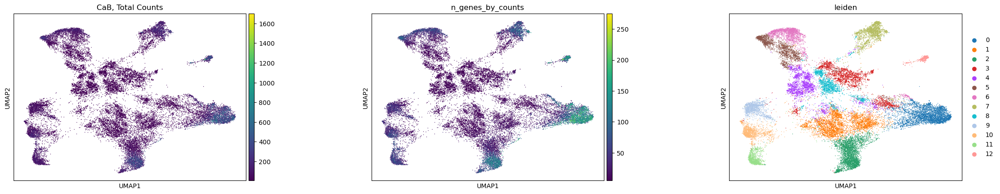

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


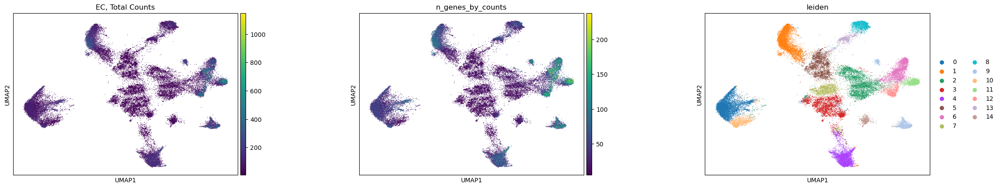

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


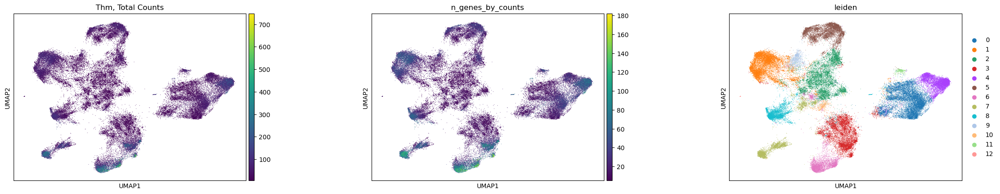

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


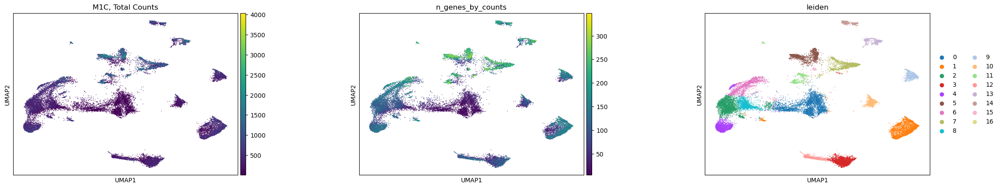

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


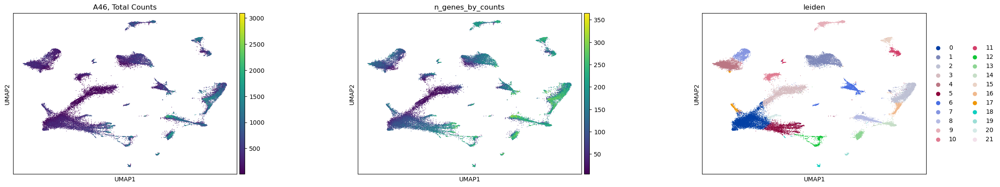

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


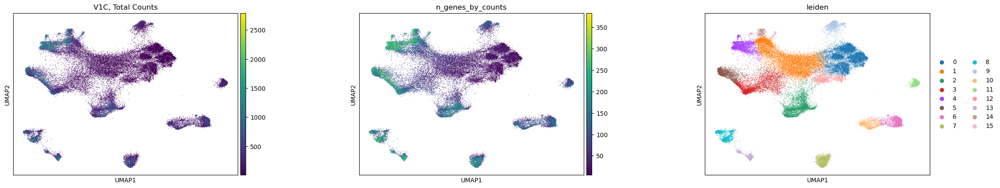

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


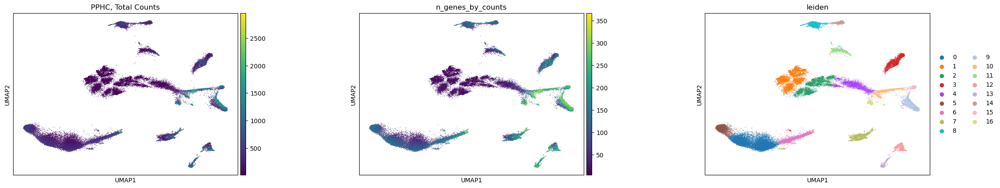

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


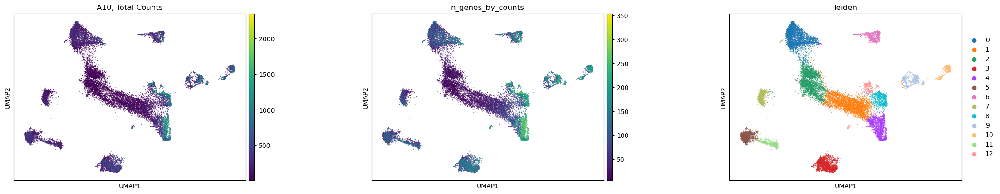

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


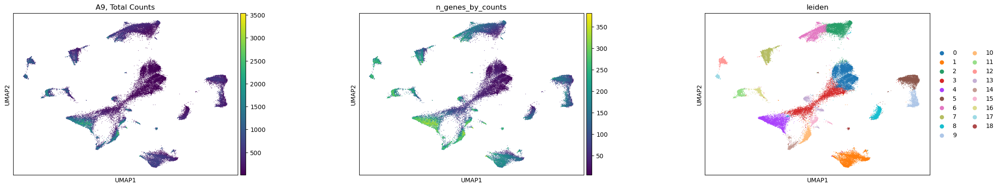

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


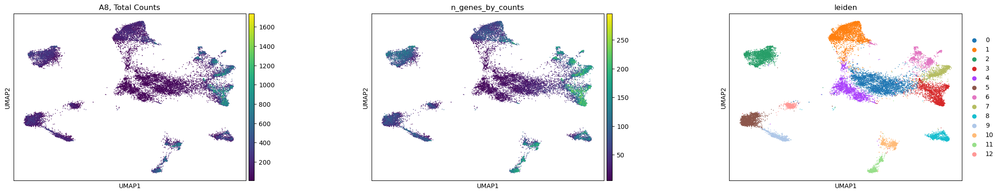

/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jeolness/anaconda3/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


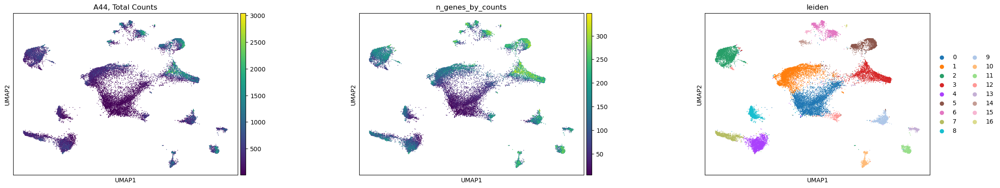

In [27]:
# Leiden Clustering Visualization

regions = [pu, cah, cab, ec, thm, m1c, a46, v1c, pphc, a10, a9, a8, a44]
names = ['Pu', 'CaH', 'CaB', 'EC', 'Thm', 'M1C', 'A46', 'V1C', 'PPHC', 'A10', 'A9', 'A8', 'A44']

for n, region in enumerate(regions):
    sc.pl.umap(
        region,
        color=[
            "total_counts",
            "n_genes_by_counts",
            "leiden",
        ],
        wspace=0.4,
        title=f"{names[n]}, Total Counts"
    )

In [28]:
adataR001 = pu[pu.obs['batch'] == 'REN001']
adataR002 = pu[pu.obs['batch'] == 'REN002']
adataR003 = cah[cah.obs['batch'] == 'REN003']
adataR004 = cab[cab.obs['batch'] == 'REN004']
adataR005 = ec[ec.obs['batch'] == 'REN005']
adataR006 = ec[ec.obs['batch'] == 'REN006']
adataR007 = thm[thm.obs['batch'] == 'REN007']
adataR008 = m1c[m1c.obs['batch'] == 'REN008']
adataR009 = a46[a46.obs['batch'] == 'REN009']
adataR010 = v1c[v1c.obs['batch'] == 'REN010']
adataR011 = pphc[pphc.obs['batch'] == 'REN011']
adataR012 = a10[a10.obs['batch'] == 'REN012']
adataR013 = a9[a9.obs['batch'] == 'REN013']
adataR014 = pu[pu.obs['batch'] == 'REN014']
adataR015 = a8[a8.obs['batch'] == 'REN015']
adataR016 = a44[a44.obs['batch'] == 'REN016']
adataR017 = thm[thm.obs['batch'] == 'REN017']

In [12]:
adataR001

View of AnnData object with n_obs × n_vars = 21350 × 500
    obs: 'fov_y', 'fov_x', 'fov', 'global_x', 'global_y', 'volume', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'blank_counts', 'misid_rate', 'counts_per_volume', 'batch', 'n_genes', 'leiden'
    var: 'n_cells_by_counts-REN003', 'mean_counts-REN003', 'log1p_mean_counts-REN003', 'pct_dropout_by_counts-REN003', 'total_counts-REN003', 'log1p_total_counts-REN003', 'n_cells_by_counts-REN004', 'mean_counts-REN004', 'log1p_mean_counts-REN004', 'pct_dropout_by_counts-REN004', 'total_counts-REN004', 'log1p_total_counts-REN004', 'n_cells_by_counts-REN005', 'mean_counts-REN005', 'log1p_mean_counts-REN005', 'pct_dropout_by_counts-REN005', 'total_counts-REN005', 'log1p_total_counts-REN005', 'n_cells_by_counts-REN006', 'mean_counts-REN006', 'log1p_mean_counts-REN006', 'pct_dropout_by_counts-REN006', 'total_counts-REN006', 'log1p_total_counts-REN006', 'n_cells_by_counts-REN007', 'mean_counts-REN007', 'l

In [34]:
import numpy as np
def rotate_spatial_coordinates(adata):
    X_spatial = adata.obsm['X_spatial']
    rotation_matrix = np.array([[0, -1],
                                    [1, 0]])
    X_spatial_rotated = X_spatial.dot(rotation_matrix)
    adata.obsm['X_spatial'] = X_spatial_rotated

rotate_spatial_coordinates(adataR004)

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_color_utils.py:27: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]


/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_color_utils.py:27: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/j

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:471: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(color_source_vector):
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:483: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_map)
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/jeolness/anaconda3/lib/python3.11/site-packages/squidpy/pl/_spatial_utils.py:649: FutureWarning: is_categorical_dtype is deprecated an

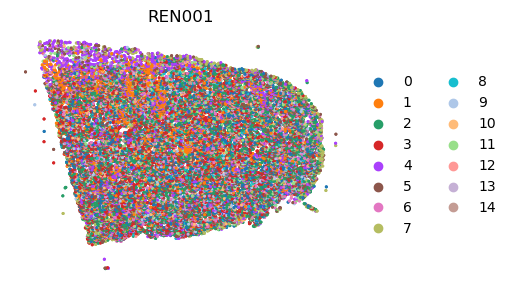

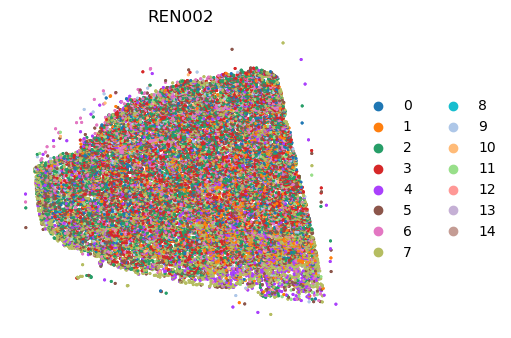

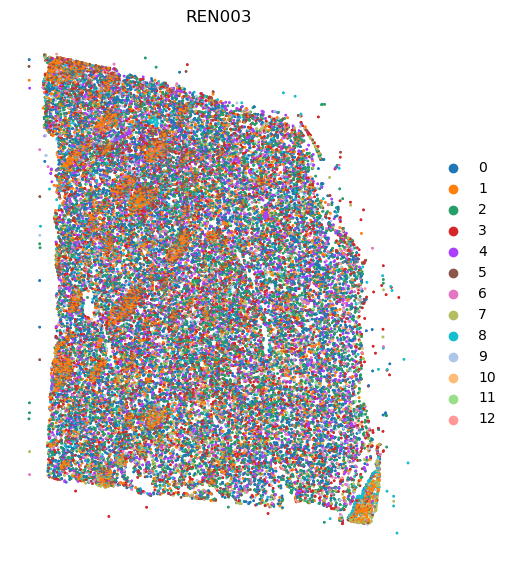

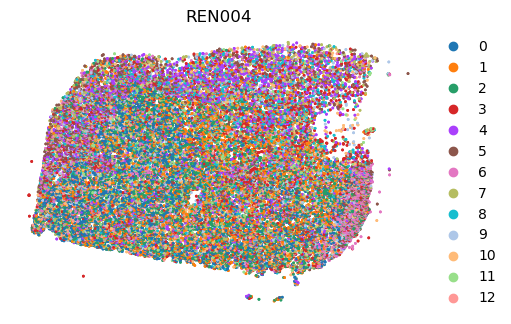

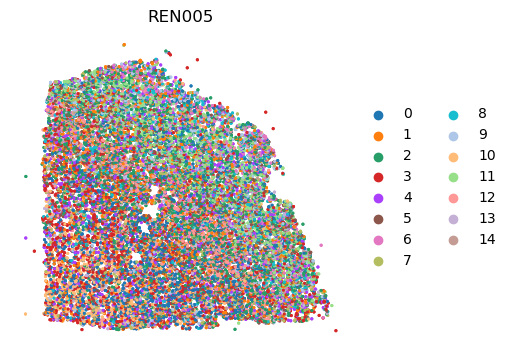

...

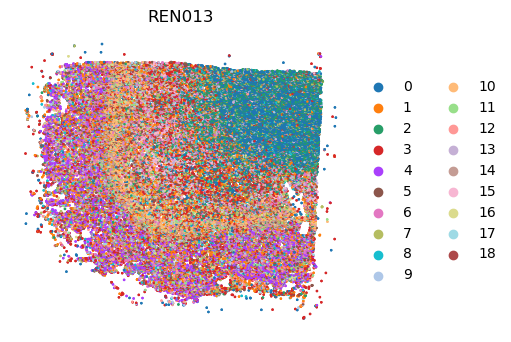

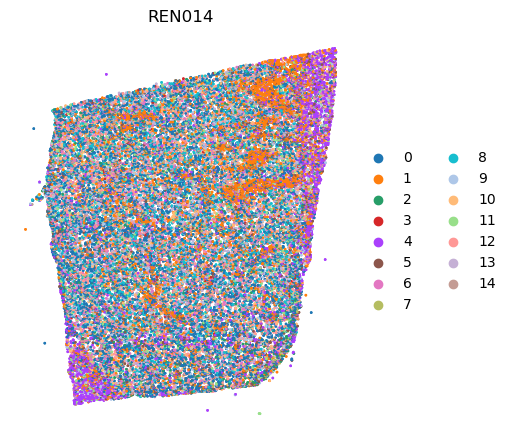

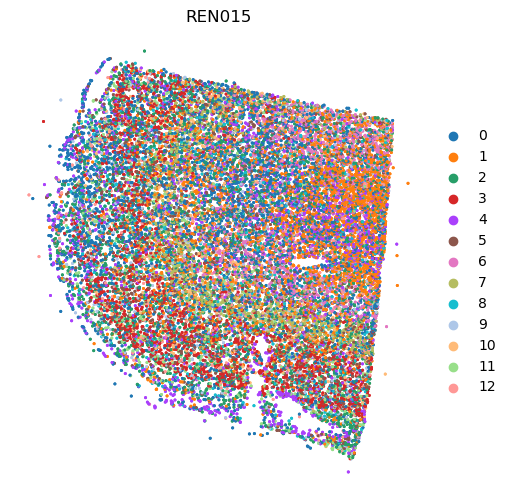

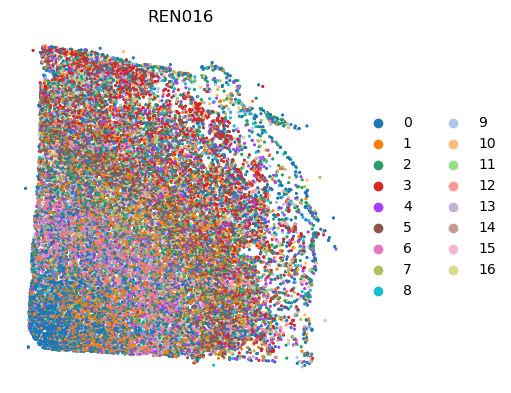

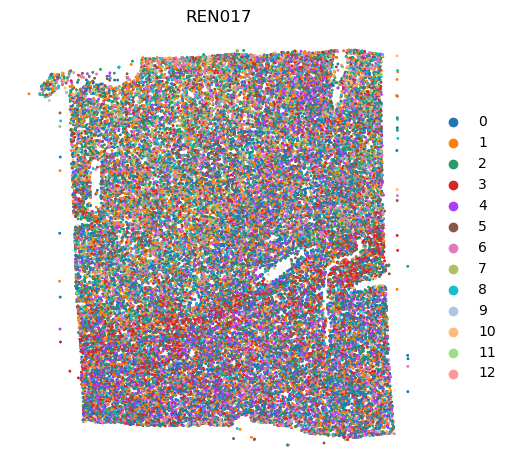

In [29]:
import squidpy as sq
samples = [adataR001, adataR002, adataR003, adataR004, adataR005, adataR006, adataR007, adataR008, adataR009, adataR010, adataR011, adataR012, adataR013, adataR014, adataR015, adataR016, adataR017]
names = ['REN001', 'REN002', 'REN003', 'REN004', 'REN005', 'REN006', 'REN007', 'REN008', 'REN009', 'REN010', 'REN011', 'REN012', 'REN013', 'REN014', 'REN015', 'REN016', 'REN017']

for n, sample in enumerate(samples):
    sq.pl.spatial_scatter(
        sample,
        shape=None,
        color=[
            "leiden",
        ],
        wspace=0.4,
        spatial_key='X_spatial',
        frameon=False,
        figsize=[5, 10],
        title=f"{names[n]}"
    )

In [30]:
adata = adataR001.concatenate([adataR002, adataR003, adataR004, adataR005, adataR006, adataR007, adataR008, adataR009, adataR010, adataR011, adataR012, adataR013, adataR014, adataR015, adataR016, adataR017], batch_categories=['REN001', 'REN002', 'REN003', 'REN004', 'REN005', 'REN006', 'REN007', 'REN008', 'REN009', 'REN010', 'REN011', 'REN012', 'REN013', 'REN014', 'REN015', 'REN016', 'REN017'])

/home/jeolness/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1823: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [31]:
adata.write('/mnt/merfish18/BICAN/objects/BICAN_R1toR17_post.h5ad')

# Correlation of genes in Ren2 and Ren8/Ren9

In [38]:
adataR002 = adata[adata.obs['batch'] == 'REN002']
adataR008 = adata[adata.obs['batch'] == 'REN008']
adataR009 = adata[adata.obs['batch'] == 'REN009']

In [39]:
genes002 = adataR002.X.toarray()
genes008 = adataR008.X.toarray()
genes009 = adataR009.X.toarray()

In [41]:
adata002_mean = genes002.mean(axis=0)
adata008_mean = genes008.mean(axis=0)
adata009_mean = genes009.mean(axis=0)

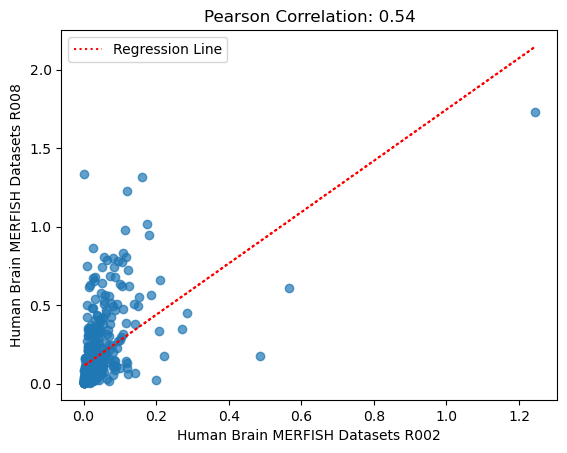

In [44]:
import scanpy as sc
import pandas as pd

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import scipy
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression

# Pearson correlation
correlation_coefficient, _ = pearsonr(adata002_mean, adata008_mean)# , adata2_mean.flatten())
# Plot scatterplot
plt.scatter(adata002_mean, adata008_mean, alpha=0.7)
plt.xlabel('Human Brain MERFISH Datasets R002')
plt.ylabel('Human Brain MERFISH Datasets R008')

# Regression line
slope, intercept = np.polyfit(adata002_mean, adata008_mean, 1)
plt.plot(adata002_mean, slope * adata002_mean + intercept, color='red', linestyle=':', label='Regression Line')
# # Equality line (y = x)
# plt.plot(adata1_mean, adata1_mean, color='gray', linestyle='--', label='Equality Line (y=x)')
plt.title(f'Pearson Correlation: {correlation_coefficient:.2f}')
plt.legend()
plt.show()

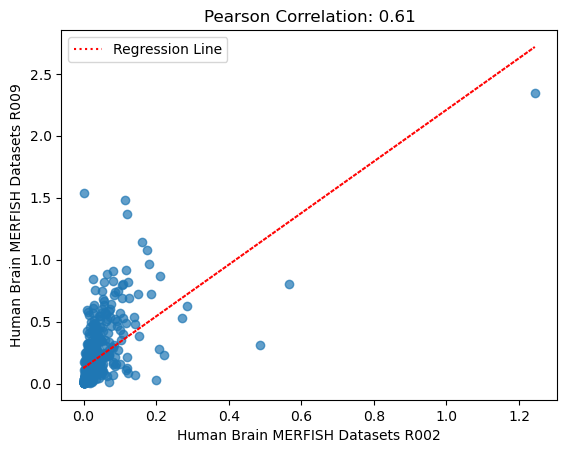

In [45]:
import scanpy as sc
import pandas as pd

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import scipy
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression

# Pearson correlation
correlation_coefficient, _ = pearsonr(adata002_mean, adata009_mean)# , adata2_mean.flatten())
# Plot scatterplot
plt.scatter(adata002_mean, adata009_mean, alpha=0.7)
# plt.title(f'Pearson Correlation: {correlation_coefficient:.2f}')
plt.xlabel('Human Brain MERFISH Datasets R002')
plt.ylabel('Human Brain MERFISH Datasets R009')

# Regression line
slope, intercept = np.polyfit(adata002_mean, adata009_mean, 1)
plt.plot(adata002_mean, slope * adata002_mean + intercept, color='red', linestyle=':', label='Regression Line')
# # Equality line (y = x)
# plt.plot(adata1_mean, adata1_mean, color='gray', linestyle='--', label='Equality Line (y=x)')
plt.title(f'Pearson Correlation: {correlation_coefficient:.2f}')
plt.legend()
plt.show()

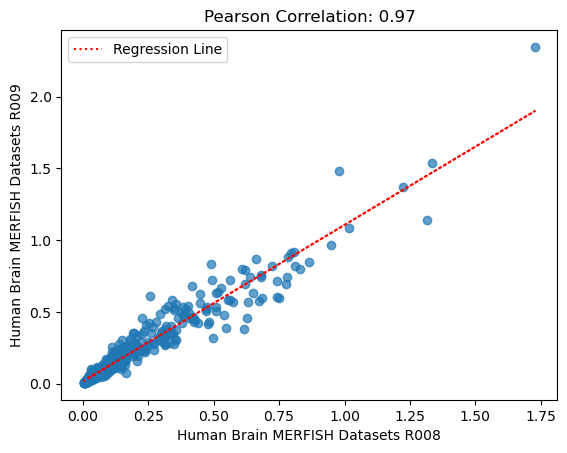

In [46]:
import scanpy as sc
import pandas as pd

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import scipy
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression

# Pearson correlation
correlation_coefficient, _ = pearsonr(adata008_mean, adata009_mean)# , adata2_mean.flatten())
# Plot scatterplot
plt.scatter(adata008_mean, adata009_mean, alpha=0.7)
# plt.title(f'Pearson Correlation: {correlation_coefficient:.2f}')
plt.xlabel('Human Brain MERFISH Datasets R008')
plt.ylabel('Human Brain MERFISH Datasets R009')

# Regression line
slope, intercept = np.polyfit(adata008_mean, adata009_mean, 1)
plt.plot(adata008_mean, slope * adata008_mean + intercept, color='red', linestyle=':', label='Regression Line')
# # Equality line (y = x)
# plt.plot(adata1_mean, adata1_mean, color='gray', linestyle='--', label='Equality Line (y=x)')
plt.title(f'Pearson Correlation: {correlation_coefficient:.2f}')
plt.legend()
plt.show()